### Project-82 : To track the performance of the worker in a civil construction site

### Business constraints : Minimise = Delay of Work ; Maximise = Performance of the worker 

### Procedure : To track the performance of a worker we have created a data set to track the location , motion , work he is doing at the site , over time if he does any , time he spent on doing work . To track the mention parameters we are using RFID  sensors , IOT , sensor and safty we are using gas and IP sensors.

### We have considered a csv file and we wil perform EDA on the file and also built up a model according the data analysis done in EDA 

#### 1. First part in EDA is to Import some of the essential libraries

In [10]:
import psycopg2
import pandas as pd
import pandas.io.sql as sqlio 
import numpy as np
import seaborn as sns 
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [11]:
connection = psycopg2.connect(user = "postgres",
                              password = "Murali.715",
                              host = "127.0.0.1",
                              port = "5432",
                              database = "Project")

In [12]:
connection

<connection object at 0x0000020FD7E9E150; dsn: 'user=postgres password=xxx dbname=Project host=127.0.0.1 port=5432', closed: 0>

In [13]:
sql = """select * from performance1"""

In [14]:
df = sqlio.read_sql_query(sql,connection)

In [15]:
df.head()

,Emp id,Name,Age,Gender,Place,Nationality,Designation,Qualification,Experience,RFID tag,...,HeartBeat,BodyTemperature,SkinSensor,RR,BloodVolume,MotionIndicater,MotionProductivity,ProductivityTime,NoiceDetection,OUTPUT
0,77-9601083,Jocelyne Braunlein,37.0,M,Malaysia,Malaysia,Un-skilled,Drywall & Acoustical (FED),9.0,76-434-8992,...,169.0,98.5,9.82,16.8,-444.35,MOP,OPERATION,8.0,YES,1.0
1,35-4656742,Carolin Spohr,38.0,M,Malaysia,India,Un-skilled,Painting & Vinyl Wall Covering,7.0,40-152-7148,...,190.0,98.4,8.20,14.4,-431.62,FHP,OPERATION,7.0,NO,1.0
2,72-3307505,Hunter Geelan,28.0,M,Malaysia,India,Skilled,Plumbing & Medical Gas,5.0,94-932-6112,...,180.0,98.6,0.54,14.5,-414.27,RBA,OPERATION,7.5,YES,0.0
3,44-1061044,Kinna Boone,34.0,M,Malaysia,India,Skilled,RF Shielding,1.0,98-386-3019,...,169.0,98.5,9.01,17.2,-398.73,WLK,DELAY,7.3,NO,1.0
4,63-0960762,Aridatha Giacomini,37.0,M,Malaysia,Malaysia,Semi-skilled,Ornamental Railings,2.0,65-742-8267,...,185.0,98.5,10.52,14.3,-395.09,CAR,TRANSPOTATION,7.4,YES,0.0


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Emp id                 1000 non-null   object 
 1   Name                   1000 non-null   object 
 2   Age                    1000 non-null   float64
 3   Gender                 1000 non-null   object 
 4   Place                  1000 non-null   object 
 5   Nationality            1000 non-null   object 
 6   Designation            1000 non-null   object 
 7   Qualification          1000 non-null   object 
 8   Experience             1000 non-null   float64
 9   RFID tag               1000 non-null   object 
 10  Attendence             1000 non-null   object 
 11  Site                   1000 non-null   object 
 12  Time in                1000 non-null   object 
 13  Time out               1000 non-null   object 
 14  WorkingHours           1000 non-null   int64  
 15  Total

In [17]:
df.columns

Index(['Emp id', 'Name', 'Age', 'Gender', 'Place', 'Nationality',
       'Designation', 'Qualification', 'Experience', 'RFID tag', 'Attendence',
       'Site', 'Time in', 'Time out', 'WorkingHours', 'Total working hours',
       'RemainingWorkingHours', 'OT', 'OTHours', 'Tool ID', 'Location',
       'HeartBeat', 'BodyTemperature', 'SkinSensor', 'RR', 'BloodVolume ',
       'MotionIndicater', 'MotionProductivity', 'ProductivityTime',
       'NoiceDetection', 'OUTPUT'],
      dtype='object')

### Performing auto EDA using pandas-profiling

In [18]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title = 'Pandas Profiling Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
df.shape

(1000, 31)

In [20]:
df

,Emp id,Name,Age,Gender,Place,Nationality,Designation,Qualification,Experience,RFID tag,...,HeartBeat,BodyTemperature,SkinSensor,RR,BloodVolume,MotionIndicater,MotionProductivity,ProductivityTime,NoiceDetection,OUTPUT
0,77-9601083,Jocelyne Braunlein,37.0,M,Malaysia,Malaysia,Un-skilled,Drywall & Acoustical (FED),9.0,76-434-8992,...,169.0,98.5,9.82,16.8,-444.35,MOP,OPERATION,8.0,YES,1.0
1,35-4656742,Carolin Spohr,38.0,M,Malaysia,India,Un-skilled,Painting & Vinyl Wall Covering,7.0,40-152-7148,...,190.0,98.4,8.20,14.4,-431.62,FHP,OPERATION,7.0,NO,1.0
2,72-3307505,Hunter Geelan,28.0,M,Malaysia,India,Skilled,Plumbing & Medical Gas,5.0,94-932-6112,...,180.0,98.6,0.54,14.5,-414.27,RBA,OPERATION,7.5,YES,0.0
3,44-1061044,Kinna Boone,34.0,M,Malaysia,India,Skilled,RF Shielding,1.0,98-386-3019,...,169.0,98.5,9.01,17.2,-398.73,WLK,DELAY,7.3,NO,1.0
4,63-0960762,Aridatha Giacomini,37.0,M,Malaysia,Malaysia,Semi-skilled,Ornamental Railings,2.0,65-742-8267,...,185.0,98.5,10.52,14.3,-395.09,CAR,TRANSPOTATION,7.4,YES,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,43-4247734,Christos Brazur,31.0,M,Malaysia,India,Un-skilled,Structural and Misc Steel (Fabrication),6.0,76-430-8738,...,162.0,98.0,7.08,17.2,24.01,AUT,INSPECTION,7.8,YES,1.0
996,26-2475053,Alexis Lowton,34.0,M,Malaysia,Malaysia,Skilled,Exterior Signage,6.0,03-483-3366,...,174.0,98.5,10.51,20.6,28.97,RBA,OPERATION,7.4,YES,1.0
997,03-9116230,Hilarius Shetliff,31.0,M,Malaysia,India,Skilled,Marlite Panels (FED),3.0,23-748-9081,...,175.0,98.5,10.32,17.2,69.36,MOP,OPERATION,7.2,NO,1.0
998,35-6823806,Pedro McPeake,25.0,M,Malaysia,Malaysia,Un-skilled,Fire Sprinkler System,6.0,31-503-1811,...,187.0,98.1,10.49,18.0,69.40,MOP,OPERATION,7.2,YES,0.0


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Emp id                 1000 non-null   object 
 1   Name                   1000 non-null   object 
 2   Age                    1000 non-null   float64
 3   Gender                 1000 non-null   object 
 4   Place                  1000 non-null   object 
 5   Nationality            1000 non-null   object 
 6   Designation            1000 non-null   object 
 7   Qualification          1000 non-null   object 
 8   Experience             1000 non-null   float64
 9   RFID tag               1000 non-null   object 
 10  Attendence             1000 non-null   object 
 11  Site                   1000 non-null   object 
 12  Time in                1000 non-null   object 
 13  Time out               1000 non-null   object 
 14  WorkingHours           1000 non-null   int64  
 15  Total

In [22]:
df.columns

Index(['Emp id', 'Name', 'Age', 'Gender', 'Place', 'Nationality',
       'Designation', 'Qualification', 'Experience', 'RFID tag', 'Attendence',
       'Site', 'Time in', 'Time out', 'WorkingHours', 'Total working hours',
       'RemainingWorkingHours', 'OT', 'OTHours', 'Tool ID', 'Location',
       'HeartBeat', 'BodyTemperature', 'SkinSensor', 'RR', 'BloodVolume ',
       'MotionIndicater', 'MotionProductivity', 'ProductivityTime',
       'NoiceDetection', 'OUTPUT'],
      dtype='object')

In [23]:
df.describe()

,Age,Experience,WorkingHours,Total working hours,RemainingWorkingHours,OTHours,HeartBeat,BodyTemperature,SkinSensor,RR,BloodVolume,ProductivityTime,OUTPUT
count,1000.00000,1000.000000,1000.000000,1000.0,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,30.74600,4.940000,32.136000,2536.0,2503.864000,2.547000,175.264000,98.500000,8.620420,16.389800,-177.601790,7.507600,0.614000
std,5.42392,2.636542,11.075386,0.0,11.075386,1.694893,9.212338,0.293643,3.240963,1.986374,166.630635,0.296395,0.487074
min,22.00000,1.000000,16.000000,2536.0,2488.000000,0.000000,160.000000,98.000000,0.490000,14.000000,-459.720000,7.000000,0.000000
25%,26.00000,3.000000,24.000000,2536.0,2496.000000,1.000000,167.000000,98.200000,7.050000,14.700000,-322.467500,7.275000,0.000000
50%,31.00000,5.000000,32.000000,2536.0,2504.000000,3.000000,175.000000,98.500000,9.920000,15.600000,-175.780000,7.500000,1.000000
75%,35.00000,7.000000,40.000000,2536.0,2512.000000,4.000000,184.000000,98.800000,10.530000,17.200000,-39.150000,7.800000,1.000000
max,40.00000,9.000000,48.000000,2536.0,2520.000000,5.000000,190.000000,99.000000,11.930000,21.100000,119.340000,8.000000,1.000000


In [24]:
df['OUTPUT'].value_counts()

1.0    614
0.0    386
Name: OUTPUT, dtype: int64

0- non productive 
1- productive

### 2.1 Null Values in the dataset

In [25]:
df.isna().sum()

Emp id                   0
Name                     0
Age                      0
Gender                   0
Place                    0
Nationality              0
Designation              0
Qualification            0
Experience               0
RFID tag                 0
Attendence               0
Site                     0
Time in                  0
Time out                 0
WorkingHours             0
Total working hours      0
RemainingWorkingHours    0
OT                       0
OTHours                  0
Tool ID                  0
Location                 0
HeartBeat                0
BodyTemperature          0
SkinSensor               0
RR                       0
BloodVolume              0
MotionIndicater          0
MotionProductivity       0
ProductivityTime         0
NoiceDetection           0
OUTPUT                   0
dtype: int64

#### Duplicate values

In [26]:
df.duplicated().sum() ## There are no duplicated values

0

#### Checking for Outliers in the data set 

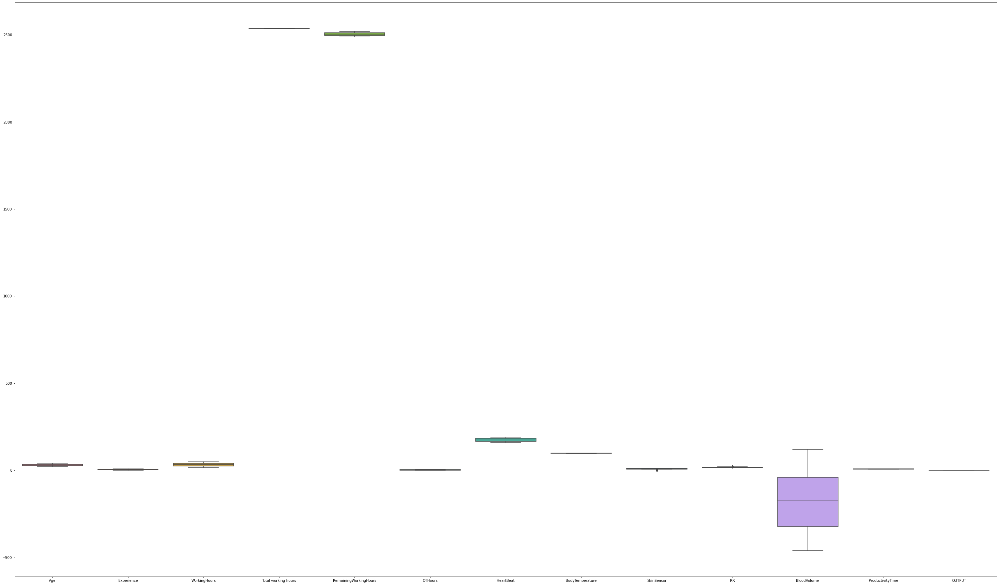

In [27]:
import matplotlib.pyplot as plt
fig=plt.figure(figsize=(50,30))
sns.boxplot(data= df)
plt.show()

## Data Visualization

### 3.1 Count Plots

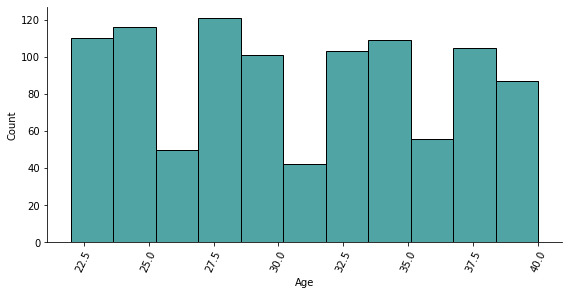

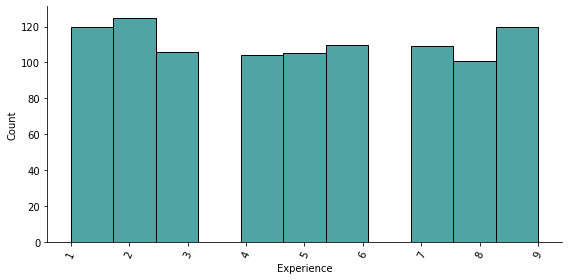

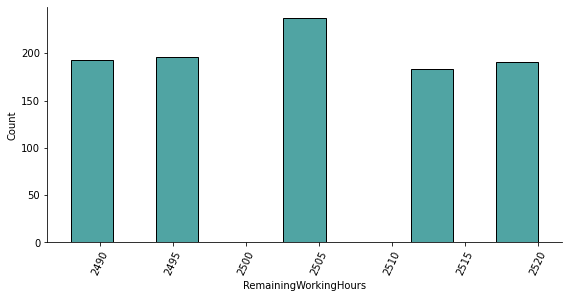

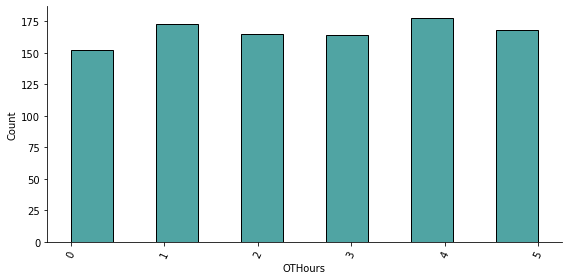

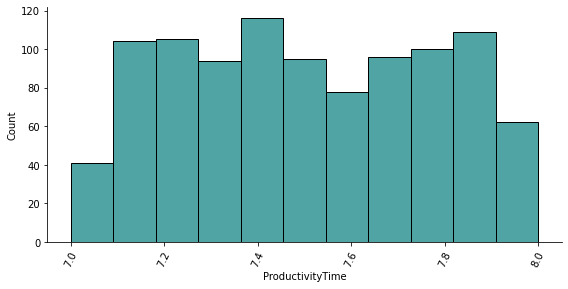

In [28]:
features_continuous = ['Age','Experience','RemainingWorkingHours', 'OTHours',"ProductivityTime"]
for feature in features_continuous:
  sns.displot(data=df, x=feature, height=4, aspect=2,color='#158685')
  plt.xticks(rotation=65)
  plt.show()

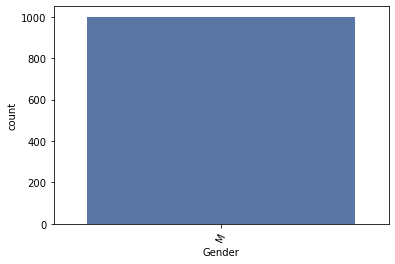

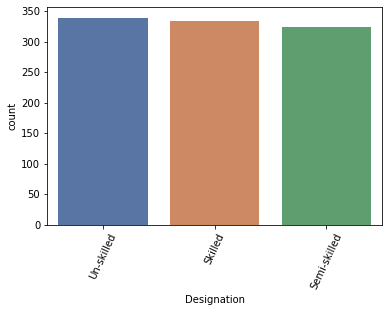

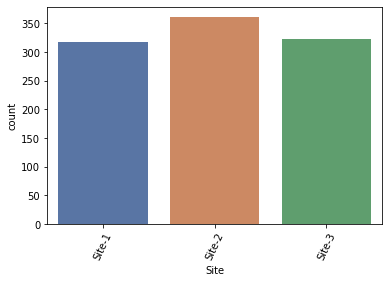

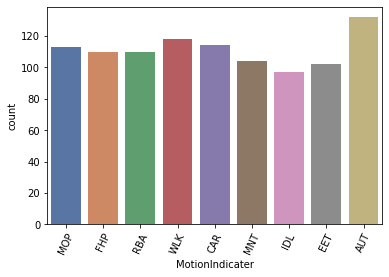

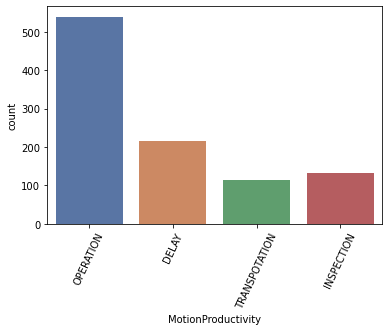

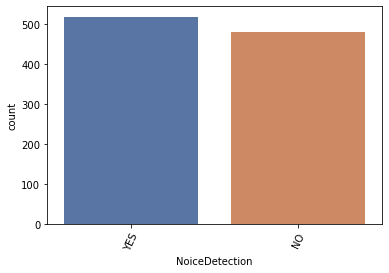

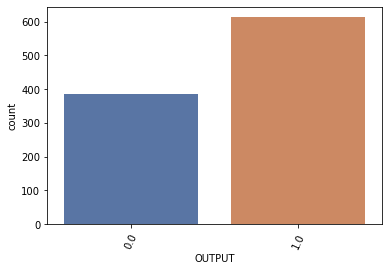

In [29]:
features_category = ['Gender', 'Designation','Site', 'MotionIndicater','MotionProductivity','NoiceDetection','OUTPUT']
for feature in features_category:
  sns.countplot(data=df, x=feature, palette='deep')
  plt.xticks(rotation=65)
  plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

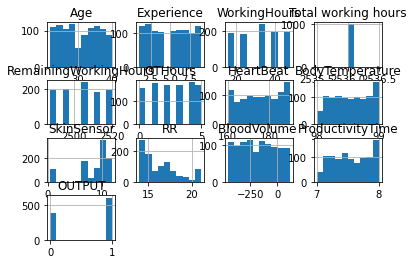

In [30]:
# Histogram
df.hist()
plt.show# overall distribution of data

In [31]:
values = df['Nationality'].value_counts()
labels = df['Nationality'].unique().tolist()

fig = px.pie(df, values = values, labels = labels, title = 'Nationality')

fig.show()
print(values)

India                   528
Malaysia                400
United Arab Emirates     69
Singapore                 3
Name: Nationality, dtype: int64


#### Pairplot

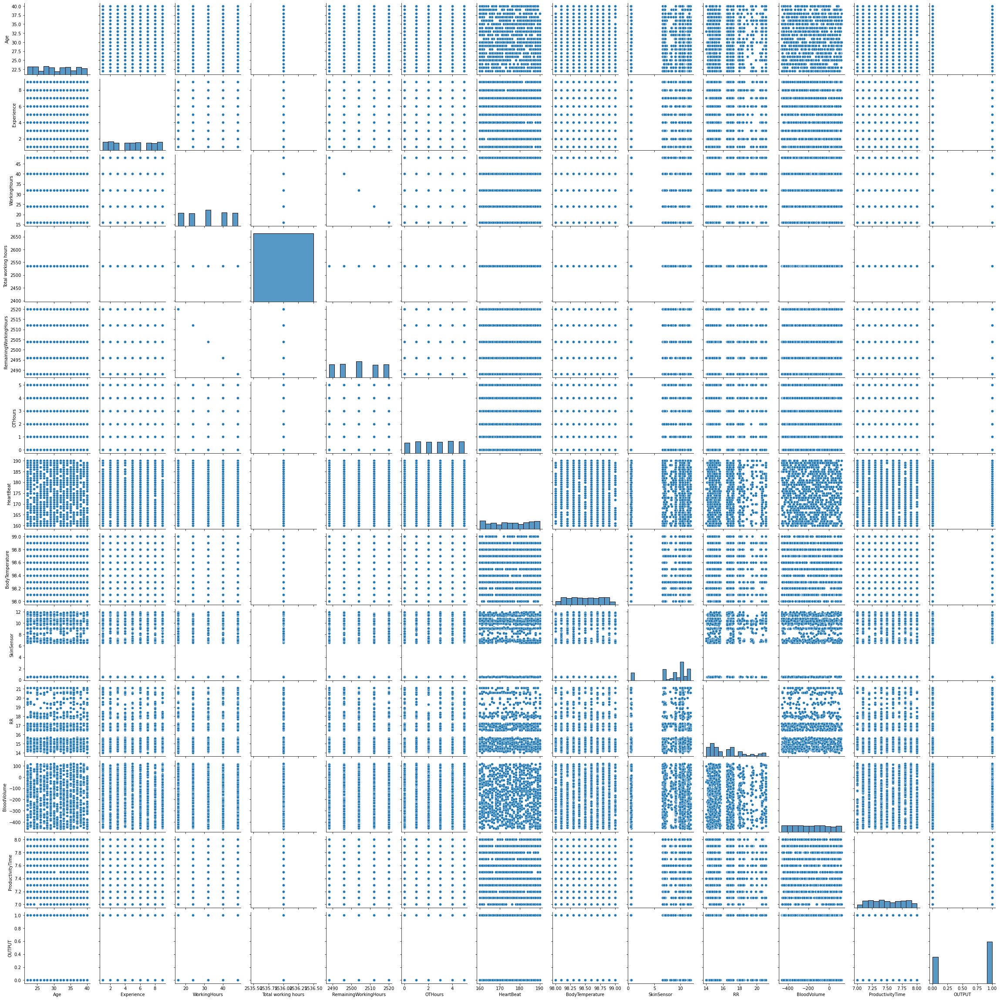

In [32]:
sns.pairplot(df)

### 3.5 Correlation Coefficent Plot

<AxesSubplot:>

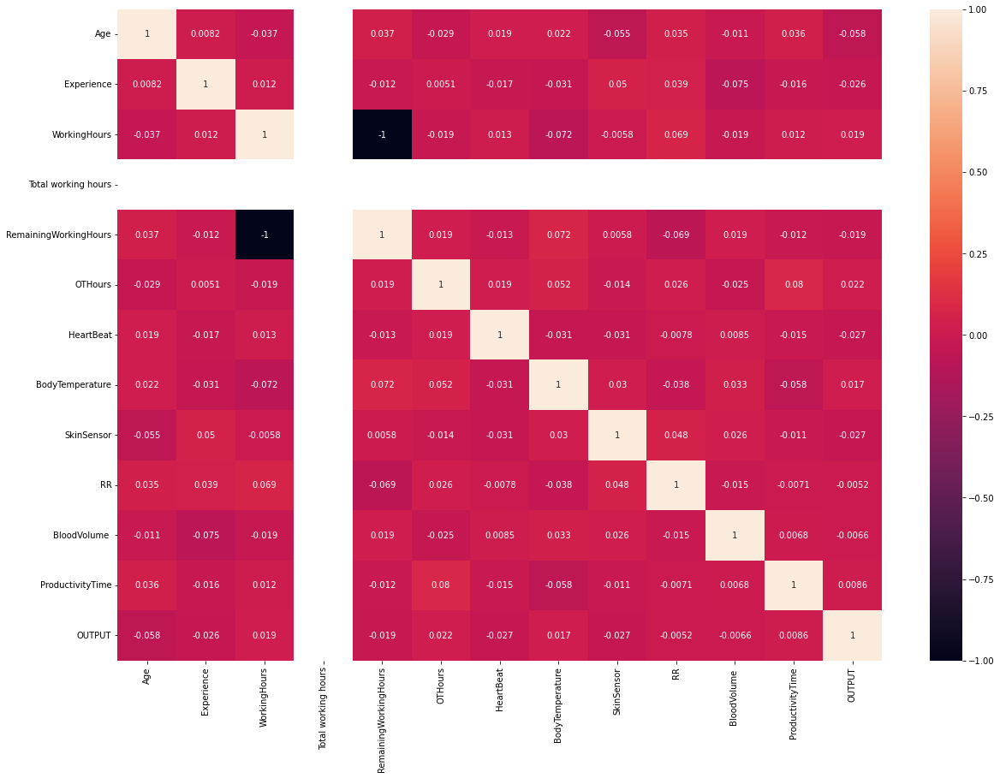

In [33]:
corelation = df.corr()
plt.figure(figsize=(20,14))
sns.heatmap(corelation, xticklabels=corelation.columns, yticklabels=corelation.columns, annot=True)

In [34]:
df1= df.drop(["Emp id","Name","Gender","Nationality","Site","Location","Qualification","Place","RFID tag","Attendence","OT","Time in","Time out","Total working hours","Tool ID"],axis=1)
df1

,Age,Designation,Experience,WorkingHours,RemainingWorkingHours,OTHours,HeartBeat,BodyTemperature,SkinSensor,RR,BloodVolume,MotionIndicater,MotionProductivity,ProductivityTime,NoiceDetection,OUTPUT
0,37.0,Un-skilled,9.0,16,2520,0,169.0,98.5,9.82,16.8,-444.35,MOP,OPERATION,8.0,YES,1.0
1,38.0,Un-skilled,7.0,32,2504,2,190.0,98.4,8.20,14.4,-431.62,FHP,OPERATION,7.0,NO,1.0
2,28.0,Skilled,5.0,40,2496,3,180.0,98.6,0.54,14.5,-414.27,RBA,OPERATION,7.5,YES,0.0
3,34.0,Skilled,1.0,32,2504,3,169.0,98.5,9.01,17.2,-398.73,WLK,DELAY,7.3,NO,1.0
4,37.0,Semi-skilled,2.0,32,2504,2,185.0,98.5,10.52,14.3,-395.09,CAR,TRANSPOTATION,7.4,YES,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,31.0,Un-skilled,6.0,40,2496,1,162.0,98.0,7.08,17.2,24.01,AUT,INSPECTION,7.8,YES,1.0
996,34.0,Skilled,6.0,16,2520,5,174.0,98.5,10.51,20.6,28.97,RBA,OPERATION,7.4,YES,1.0
997,31.0,Skilled,3.0,24,2512,5,175.0,98.5,10.32,17.2,69.36,MOP,OPERATION,7.2,NO,1.0
998,25.0,Un-skilled,6.0,16,2520,1,187.0,98.1,10.49,18.0,69.40,MOP,OPERATION,7.2,YES,0.0


In [35]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    1000 non-null   float64
 1   Designation            1000 non-null   object 
 2   Experience             1000 non-null   float64
 3   WorkingHours           1000 non-null   int64  
 4   RemainingWorkingHours  1000 non-null   int64  
 5   OTHours                1000 non-null   int64  
 6   HeartBeat              1000 non-null   float64
 7   BodyTemperature        1000 non-null   float64
 8   SkinSensor             1000 non-null   float64
 9   RR                     1000 non-null   float64
 10  BloodVolume            1000 non-null   float64
 11  MotionIndicater        1000 non-null   object 
 12  MotionProductivity     1000 non-null   object 
 13  ProductivityTime       1000 non-null   float64
 14  NoiceDetection         1000 non-null   object 
 15  OUTPU

#### 4. Data Preprocessing

In [36]:
labelencoder = LabelEncoder()

In [37]:
df1["Designation"]= labelencoder.fit_transform(df1["Designation"])
df1["MotionProductivity"]= labelencoder.fit_transform(df1["MotionProductivity"])
df1["MotionIndicater"] = labelencoder.fit_transform(df1["MotionIndicater"])
df1["NoiceDetection"]= labelencoder.fit_transform(df1["NoiceDetection"])
df1

,Age,Designation,Experience,WorkingHours,RemainingWorkingHours,OTHours,HeartBeat,BodyTemperature,SkinSensor,RR,BloodVolume,MotionIndicater,MotionProductivity,ProductivityTime,NoiceDetection,OUTPUT
0,37.0,2,9.0,16,2520,0,169.0,98.5,9.82,16.8,-444.35,6,2,8.0,1,1.0
1,38.0,2,7.0,32,2504,2,190.0,98.4,8.20,14.4,-431.62,3,2,7.0,0,1.0
2,28.0,1,5.0,40,2496,3,180.0,98.6,0.54,14.5,-414.27,7,2,7.5,1,0.0
3,34.0,1,1.0,32,2504,3,169.0,98.5,9.01,17.2,-398.73,8,0,7.3,0,1.0
4,37.0,0,2.0,32,2504,2,185.0,98.5,10.52,14.3,-395.09,1,3,7.4,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,31.0,2,6.0,40,2496,1,162.0,98.0,7.08,17.2,24.01,0,1,7.8,1,1.0
996,34.0,1,6.0,16,2520,5,174.0,98.5,10.51,20.6,28.97,7,2,7.4,1,1.0
997,31.0,1,3.0,24,2512,5,175.0,98.5,10.32,17.2,69.36,6,2,7.2,0,1.0
998,25.0,2,6.0,16,2520,1,187.0,98.1,10.49,18.0,69.40,6,2,7.2,1,0.0


In [38]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    1000 non-null   float64
 1   Designation            1000 non-null   int32  
 2   Experience             1000 non-null   float64
 3   WorkingHours           1000 non-null   int64  
 4   RemainingWorkingHours  1000 non-null   int64  
 5   OTHours                1000 non-null   int64  
 6   HeartBeat              1000 non-null   float64
 7   BodyTemperature        1000 non-null   float64
 8   SkinSensor             1000 non-null   float64
 9   RR                     1000 non-null   float64
 10  BloodVolume            1000 non-null   float64
 11  MotionIndicater        1000 non-null   int32  
 12  MotionProductivity     1000 non-null   int32  
 13  ProductivityTime       1000 non-null   float64
 14  NoiceDetection         1000 non-null   int32  
 15  OUTPU

#### 4.2 Variance, Skewness and Kurtosis

In [39]:
df.var() # variance of Numeric Variables

Age                         29.418903
Experience                   6.951351
WorkingHours               122.664168
Total working hours          0.000000
RemainingWorkingHours      122.664168
OTHours                      2.872664
HeartBeat                   84.867171
BodyTemperature              0.086226
SkinSensor                  10.503840
RR                           3.945682
BloodVolume              27765.768506
ProductivityTime             0.087850
OUTPUT                       0.237241
dtype: float64

In [40]:
df.skew()

Age                      0.045555
Experience               0.034599
WorkingHours            -0.025952
Total working hours      0.000000
RemainingWorkingHours    0.025952
OTHours                 -0.028427
HeartBeat               -0.054385
BodyTemperature         -0.004754
SkinSensor              -1.555505
RR                       0.909149
BloodVolume              0.047250
ProductivityTime         0.030299
OUTPUT                  -0.469039
dtype: float64

In [41]:
df.kurt()

Age                     -1.219023
Experience              -1.270912
WorkingHours            -1.220466
Total working hours      0.000000
RemainingWorkingHours   -1.220466
OTHours                 -1.265756
HeartBeat               -1.236504
BodyTemperature         -1.195173
SkinSensor               1.471647
RR                      -0.186516
BloodVolume             -1.166738
ProductivityTime        -1.205753
OUTPUT                  -1.783573
dtype: float64

## 5.Model Building

#### 5.1 Dropping Unnecessary Columns

In [42]:
# separating the data and labels
X = df1.drop(columns = 'OUTPUT', axis=1)
Y = df1['OUTPUT']

In [43]:
# Normalization function

def norm_func(i):
    x = (i - i.min())/(i.max() - i.min())
    return (x)

# Normalized data frame (considering the numerical part of data)
df1 = norm_func(X)

In [44]:
df1

,Age,Designation,Experience,WorkingHours,RemainingWorkingHours,OTHours,HeartBeat,BodyTemperature,SkinSensor,RR,BloodVolume,MotionIndicater,MotionProductivity,ProductivityTime,NoiceDetection
0,0.833333,1.0,1.000,0.00,1.00,0.0,0.300000,0.5,0.815559,0.394366,0.026543,0.750,0.666667,1.0,1.0
1,0.888889,1.0,0.750,0.50,0.50,0.4,1.000000,0.4,0.673951,0.056338,0.048527,0.375,0.666667,0.0,0.0
2,0.333333,0.5,0.500,0.75,0.25,0.6,0.666667,0.6,0.004371,0.070423,0.078489,0.875,0.666667,0.5,1.0
3,0.666667,0.5,0.000,0.50,0.50,0.6,0.300000,0.5,0.744755,0.450704,0.105326,1.000,0.000000,0.3,0.0
4,0.833333,0.0,0.125,0.50,0.50,0.4,0.833333,0.5,0.876748,0.042254,0.111612,0.125,1.000000,0.4,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.500000,1.0,0.625,0.75,0.25,0.2,0.066667,0.0,0.576049,0.450704,0.835371,0.000,0.333333,0.8,1.0
996,0.666667,0.5,0.625,0.00,1.00,1.0,0.466667,0.5,0.875874,0.929577,0.843937,0.875,0.666667,0.4,1.0
997,0.500000,0.5,0.250,0.25,0.75,1.0,0.500000,0.5,0.859266,0.450704,0.913688,0.750,0.666667,0.2,0.0
998,0.166667,1.0,0.625,0.00,1.00,0.2,0.900000,0.1,0.874126,0.563380,0.913757,0.750,0.666667,0.2,1.0


In [45]:
X = df1
X
Y

0      1.0
1      1.0
2      0.0
3      1.0
4      0.0
      ... 
995    1.0
996    1.0
997    1.0
998    0.0
999    1.0
Name: OUTPUT, Length: 1000, dtype: float64

In [46]:
# splitting the data into testing and training data.
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, stratify=Y, random_state=2)

In [47]:
print(X.shape, X_train.shape, X_test.shape)

(1000, 15) (700, 15) (300, 15)


In [48]:
# Support Vector Machine (SVM-Black Box Technique)   
from sklearn import svm
from sklearn.metrics import accuracy_score
classifier = svm.SVC(kernel='linear')

In [49]:
#training the support vector Machine Classifier
classifier.fit(X_train, Y_train)

SVC(kernel='linear')

In [50]:
# accuracy score on the training data
X_train_prediction = classifier.predict(X_train)
training_data_accuracy = accuracy_score(X_train_prediction, Y_train)
print('Accuracy score of the training data : ', training_data_accuracy)

Accuracy score of the training data :  0.6142857142857143


In [51]:
# accuracy score on the test data
X_test_prediction = classifier.predict(X_test)
test_data_accuracy = accuracy_score(X_test_prediction, Y_test)
print('Accuracy score of the test data : ', test_data_accuracy)

Accuracy score of the test data :  0.6133333333333333


In [52]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()

In [53]:
# Training the LogisticRegression model with Training data
model.fit(X_train, Y_train)

LogisticRegression()

In [54]:
# accuracy on training data
X_train_prediction = model.predict(X_train)
training_data_accuracy = accuracy_score(X_train_prediction, Y_train)

In [55]:
print('Accuracy on Training data : ', training_data_accuracy)

Accuracy on Training data :  0.6157142857142858


In [56]:
# accuracy on test data
X_test_prediction = model.predict(X_test)
test_data_accuracy = accuracy_score(X_test_prediction, Y_test)

In [57]:
print('Accuracy on Test data : ', test_data_accuracy)

Accuracy on Test data :  0.5866666666666667


# Saving the trained model

In [61]:
import pickle
file = 'model.pkl'
pickle.dump(classifier, open(file,'wb'))

In [62]:
# loading the saved model
loaded_model = pickle.load(open('model.pkl', 'rb'))

In [63]:
## Building a Predictive System 
input_data = (25,2,6,16,2520,1,187,98.1,10.49,18.0,69.40,6,2,7.2,1)

# changing the input_data to numpy array
input_data_as_numpy_array = np.asarray(input_data)

# reshape the array as we are predicting for one instance
input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = loaded_model.predict(input_data_reshaped)
print(prediction)

if (prediction[0] == 0):
  print('The person is not productive')
else:
  print('The person is productive')

[1.]
The person is productive
